<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [ ]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [ ]:
import json

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from tqdm import tqdm
import h5py

In [ ]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [ ]:
# !cp img_codes.hdf5 /content/img_codes.hdf5

In [ ]:
f = h5py.File('img_codes.hdf5', 'r')
img_codes = f['data']

In [ ]:
captions = json.load(open('captions_tokenized.json'))

In [ ]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [ ]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [ ]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for img_captions in captions:
    for sentence in img_captions: 
        for word in sentence:
            word_counts[word] += 1 

In [ ]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [ ]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [ ]:
#try it out on several descriptions of a random image
as_matrix(captions[234])

array([[   1,   53,  618,  241, 1003, 1529,  114,  572,   14, 1095,   18,
          14,  336,   13,    2],
       [   1,   53,  953, 1530,  114,  572,  831,   62,   50,  182,   13,
           2,    3,    3,    3],
       [   1,   53,  352, 1531,  114,  572,   18, 1532,  332,   13,    2,
           3,    3,    3,    3],
       [   1,   14,  272,  572,  563,   14, 1095,   18,   43,  336,   27,
          53,  953,    2,    3],
       [   1,   14,  180,  272,  181,  572,  232,   83,   18,   43,  332,
          13,    2,    3,    3]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [ ]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result = torch.bmm(queries, keys.transpose(1, 2)) / (keys.shape[2] ** 0.5)
        return result

Test for ScaledDotProductScore

In [ ]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [ ]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.scorer = scorer.to(self.device)

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        # <YOUR CODE HERE>
        weights = nn.Softmax(dim=2)(scores)
        self.attention_map = weights.detach()
        # <YOUR CODE HERE>
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [ ]:
attn = Attention(ScaledDotProductScore())

In [ ]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [ ]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [ ]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [ ]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        self.lstm_units = lstm_units
        self.cnn_channels = cnn_channels
        self.n_tokens = n_tokens
        self.emb_size = emb_size


        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size, padding_idx=pad_ix)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())
    
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size + cnn_channels, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Sequential(
            nn.Linear(emb_size + lstm_units + cnn_channels, int(self.n_tokens*0.5)),
            nn.ReLU(),
            nn.Linear(int(self.n_tokens*0.5), self.n_tokens)
            )
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell   = self.cnn_to_c0(image_features.mean(2))
        initial_hid    = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        attn_keys      = self.cnn_to_attn_key(image_features)

        # compute embeddings for captions_ix
        captions_emb   = self.emb(captions_ix)



        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)

        hidden_states = []
        attention_maps = []

        for i in range(captions_ix.shape[1]):
            caption_emb = captions_emb[:, i, :]
            context = self.attention(initial_hid.unsqueeze(dim=1), attn_keys, image_features).squeeze(dim=1)
            attention_map = self.attention.attention_map
            initial_hid, initial_cell = self.lstm(torch.cat((context, caption_emb), dim=1), (initial_hid, initial_cell))
            recurrent_out = torch.cat((initial_hid, caption_emb, context), dim=1)
            hidden_states.append(recurrent_out.unsqueeze(dim=1))
            attention_maps.append(attention_map)

        attention_maps = torch.cat(attention_maps, dim=1)
        hidden_states = torch.cat(hidden_states, dim=1)
        logits = self.logits_mlp(hidden_states)
        # return logits and attention maps from (2.4)
        return logits, attention_maps

In [ ]:
network = CaptionNet(n_tokens)

In [ ]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
# dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [ ]:
loss_func = nn.CrossEntropyLoss(ignore_index=pad_ix)

def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    loss = loss_func(logits_for_next.permute(0, 2, 1), captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [ ]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [ ]:
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [ ]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [ ]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [ ]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [ ]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [ ]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [ ]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [00:21<00:00,  2.99it/s]



Epoch: 0, train loss: 5.318868562579155, val loss: 4.593489170074463


100%|██████████| 64/64 [00:22<00:00,  2.88it/s]



Epoch: 1, train loss: 4.36588554084301, val loss: 4.247966170310974


100%|██████████| 64/64 [00:24<00:00,  2.59it/s]



Epoch: 2, train loss: 4.1624524630606174, val loss: 4.122259855270386


100%|██████████| 64/64 [00:24<00:00,  2.63it/s]



Epoch: 3, train loss: 4.003926232457161, val loss: 3.9181462824344635


100%|██████████| 64/64 [00:24<00:00,  2.60it/s]



Epoch: 4, train loss: 3.900136847048998, val loss: 3.9127854108810425


100%|██████████| 64/64 [00:23<00:00,  2.70it/s]



Epoch: 5, train loss: 3.8324207961559296, val loss: 3.7851929664611816


100%|██████████| 64/64 [00:23<00:00,  2.76it/s]



Epoch: 6, train loss: 3.7706530392169952, val loss: 3.7824160754680634


100%|██████████| 64/64 [00:22<00:00,  2.81it/s]



Epoch: 7, train loss: 3.7322275526821613, val loss: 3.6656954884529114


100%|██████████| 64/64 [00:22<00:00,  2.85it/s]



Epoch: 8, train loss: 3.703439511358738, val loss: 3.7499238550662994


100%|██████████| 64/64 [00:22<00:00,  2.89it/s]



Epoch: 9, train loss: 3.6825715601444244, val loss: 3.6235044598579407


100%|██████████| 64/64 [00:21<00:00,  2.92it/s]



Epoch: 10, train loss: 3.6303259693086147, val loss: 3.530061185359955


100%|██████████| 64/64 [00:22<00:00,  2.90it/s]



Epoch: 11, train loss: 3.6280033960938454, val loss: 3.629181891679764


100%|██████████| 64/64 [00:21<00:00,  3.01it/s]



Epoch: 12, train loss: 3.5760021060705185, val loss: 3.538365751504898


100%|██████████| 64/64 [00:21<00:00,  2.92it/s]



Epoch: 13, train loss: 3.577199261635542, val loss: 3.561161518096924


100%|██████████| 64/64 [00:22<00:00,  2.90it/s]



Epoch: 14, train loss: 3.560585677623749, val loss: 3.459510773420334


100%|██████████| 64/64 [00:21<00:00,  2.97it/s]



Epoch: 15, train loss: 3.537477757781744, val loss: 3.592947632074356


100%|██████████| 64/64 [00:21<00:00,  2.96it/s]



Epoch: 16, train loss: 3.5327752716839314, val loss: 3.46125990152359


100%|██████████| 64/64 [00:22<00:00,  2.88it/s]



Epoch: 17, train loss: 3.502633426338434, val loss: 3.4399138689041138


100%|██████████| 64/64 [00:21<00:00,  2.95it/s]



Epoch: 18, train loss: 3.5103278681635857, val loss: 3.577713280916214


100%|██████████| 64/64 [00:21<00:00,  3.03it/s]



Epoch: 19, train loss: 3.4872240126132965, val loss: 3.486499637365341


100%|██████████| 64/64 [00:22<00:00,  2.84it/s]



Epoch: 20, train loss: 3.4654174521565437, val loss: 3.402052789926529


100%|██████████| 64/64 [00:22<00:00,  2.82it/s]



Epoch: 21, train loss: 3.489022307097912, val loss: 3.4644091427326202


100%|██████████| 64/64 [00:21<00:00,  2.91it/s]



Epoch: 22, train loss: 3.464189473539591, val loss: 3.473208785057068


100%|██████████| 64/64 [00:21<00:00,  2.97it/s]



Epoch: 23, train loss: 3.446521658450365, val loss: 3.475399613380432


100%|██████████| 64/64 [00:21<00:00,  2.99it/s]



Epoch: 24, train loss: 3.404553420841694, val loss: 3.4185117185115814


100%|██████████| 64/64 [00:21<00:00,  2.97it/s]



Epoch: 25, train loss: 3.443583857268095, val loss: 3.426052212715149


100%|██████████| 64/64 [00:21<00:00,  3.02it/s]



Epoch: 26, train loss: 3.3903165720403194, val loss: 3.4854055643081665


100%|██████████| 64/64 [00:25<00:00,  2.55it/s]



Epoch: 27, train loss: 3.362138479948044, val loss: 3.4177181720733643


100%|██████████| 64/64 [00:31<00:00,  2.00it/s]



Epoch: 28, train loss: 3.330586887896061, val loss: 3.3476040065288544


100%|██████████| 64/64 [00:31<00:00,  2.06it/s]



Epoch: 29, train loss: 3.343223165720701, val loss: 3.370952397584915


100%|██████████| 64/64 [00:31<00:00,  2.02it/s]



Epoch: 30, train loss: 3.31305630877614, val loss: 3.362038403749466


100%|██████████| 64/64 [00:33<00:00,  1.93it/s]



Epoch: 31, train loss: 3.3183690682053566, val loss: 3.3540060222148895


100%|██████████| 64/64 [00:34<00:00,  1.87it/s]



Epoch: 32, train loss: 3.3013744466006756, val loss: 3.3560045063495636


100%|██████████| 64/64 [00:36<00:00,  1.77it/s]



Epoch: 33, train loss: 3.333003006875515, val loss: 3.3350135385990143


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 34, train loss: 3.3193523213267326, val loss: 3.4082813560962677


100%|██████████| 64/64 [00:38<00:00,  1.64it/s]



Epoch: 35, train loss: 3.347608096897602, val loss: 3.3707560896873474


100%|██████████| 64/64 [00:39<00:00,  1.64it/s]



Epoch: 36, train loss: 3.2977030239999294, val loss: 3.4237830340862274


100%|██████████| 64/64 [00:39<00:00,  1.60it/s]



Epoch: 37, train loss: 3.293560814112425, val loss: 3.336556375026703


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 38, train loss: 3.270591039210558, val loss: 3.421737641096115


100%|██████████| 64/64 [00:38<00:00,  1.66it/s]



Epoch: 39, train loss: 3.263502173125744, val loss: 3.2643827497959137


100%|██████████| 64/64 [00:40<00:00,  1.59it/s]



Epoch: 40, train loss: 3.2630432471632957, val loss: 3.259565591812134


100%|██████████| 64/64 [00:38<00:00,  1.64it/s]



Epoch: 41, train loss: 3.2728554904460907, val loss: 3.3398129045963287


100%|██████████| 64/64 [00:38<00:00,  1.65it/s]



Epoch: 42, train loss: 3.271170910447836, val loss: 3.270730674266815


100%|██████████| 64/64 [00:38<00:00,  1.64it/s]



Epoch: 43, train loss: 3.2735750451684, val loss: 3.311753123998642


100%|██████████| 64/64 [00:38<00:00,  1.65it/s]



Epoch: 44, train loss: 3.2542188838124275, val loss: 3.2991077303886414


100%|██████████| 64/64 [00:38<00:00,  1.68it/s]



Epoch: 45, train loss: 3.2530496269464493, val loss: 3.273181766271591


100%|██████████| 64/64 [00:38<00:00,  1.66it/s]



Epoch: 46, train loss: 3.2285012304782867, val loss: 3.408352643251419


100%|██████████| 64/64 [00:38<00:00,  1.65it/s]



Epoch: 47, train loss: 3.275697696954012, val loss: 3.357061982154846


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 48, train loss: 3.250906638801098, val loss: 3.36595618724823


100%|██████████| 64/64 [00:38<00:00,  1.65it/s]



Epoch: 49, train loss: 3.2570194378495216, val loss: 3.315462738275528


100%|██████████| 64/64 [00:39<00:00,  1.61it/s]



Epoch: 50, train loss: 3.2711059153079987, val loss: 3.312545895576477


100%|██████████| 64/64 [00:39<00:00,  1.60it/s]



Epoch: 51, train loss: 3.2649327255785465, val loss: 3.2675355672836304


100%|██████████| 64/64 [00:38<00:00,  1.65it/s]



Epoch: 52, train loss: 3.213434111326933, val loss: 3.3112065196037292


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 53, train loss: 3.193678267300129, val loss: 3.277717888355255


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 54, train loss: 3.2071710526943207, val loss: 3.3072426319122314


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 55, train loss: 3.2252778001129627, val loss: 3.3291249573230743


100%|██████████| 64/64 [00:38<00:00,  1.67it/s]



Epoch: 56, train loss: 3.1878207810223103, val loss: 3.2361916303634644


100%|██████████| 64/64 [00:37<00:00,  1.69it/s]



Epoch: 57, train loss: 3.1723011769354343, val loss: 3.2450397312641144


100%|██████████| 64/64 [00:36<00:00,  1.73it/s]



Epoch: 58, train loss: 3.152146775275469, val loss: 3.2305136620998383


100%|██████████| 64/64 [00:34<00:00,  1.85it/s]



Epoch: 59, train loss: 3.191996842622757, val loss: 3.2642765939235687


100%|██████████| 64/64 [00:31<00:00,  2.00it/s]



Epoch: 60, train loss: 3.156922910362482, val loss: 3.2490340769290924


100%|██████████| 64/64 [00:34<00:00,  1.86it/s]



Epoch: 61, train loss: 3.198023796081543, val loss: 3.304345577955246


100%|██████████| 64/64 [00:36<00:00,  1.74it/s]



Epoch: 62, train loss: 3.162582639604807, val loss: 3.2487065494060516


100%|██████████| 64/64 [00:38<00:00,  1.66it/s]



Epoch: 63, train loss: 3.195299956947565, val loss: 3.189549535512924
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [ ]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [ ]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [ ]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

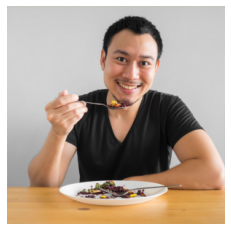

In [ ]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man in a white shirt holding a white plate .
a man is holding a white and white plate .
a man is holding a white and white tie .
a man in a white shirt holding a white frisbee .
a man with a tie and a tie on a table .
a man in a blue shirt holding a white frisbee .
a man is holding a white frisbee in his hands .
a man with a tie and a tie on it .
a man is holding a white plate with a plate of food .
a man is holding a white plate with a plate of food .


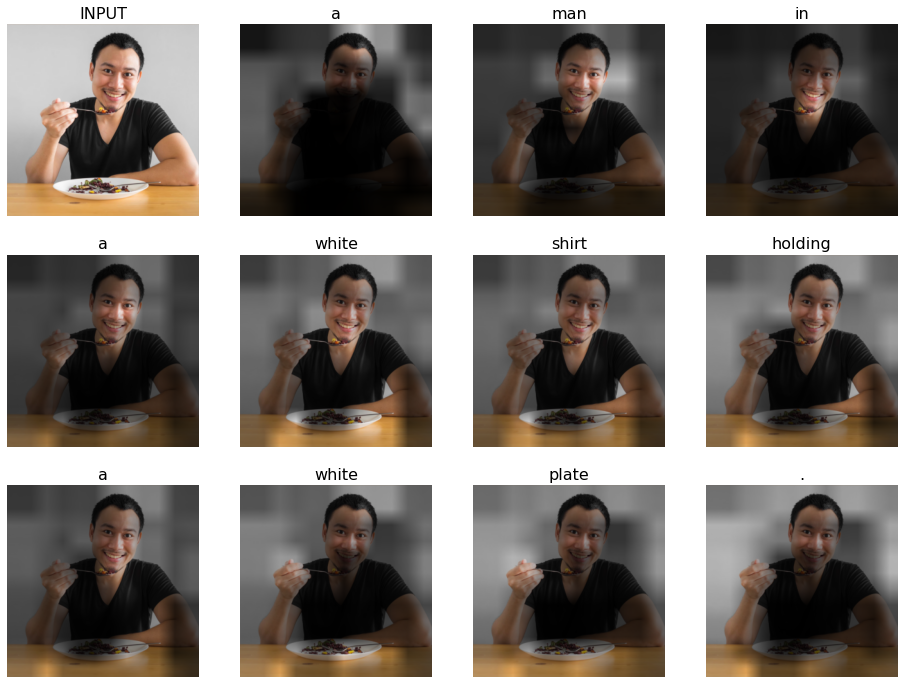

In [ ]:
process_image(img)

a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man on a bike on a dirt bike path .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man is riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .


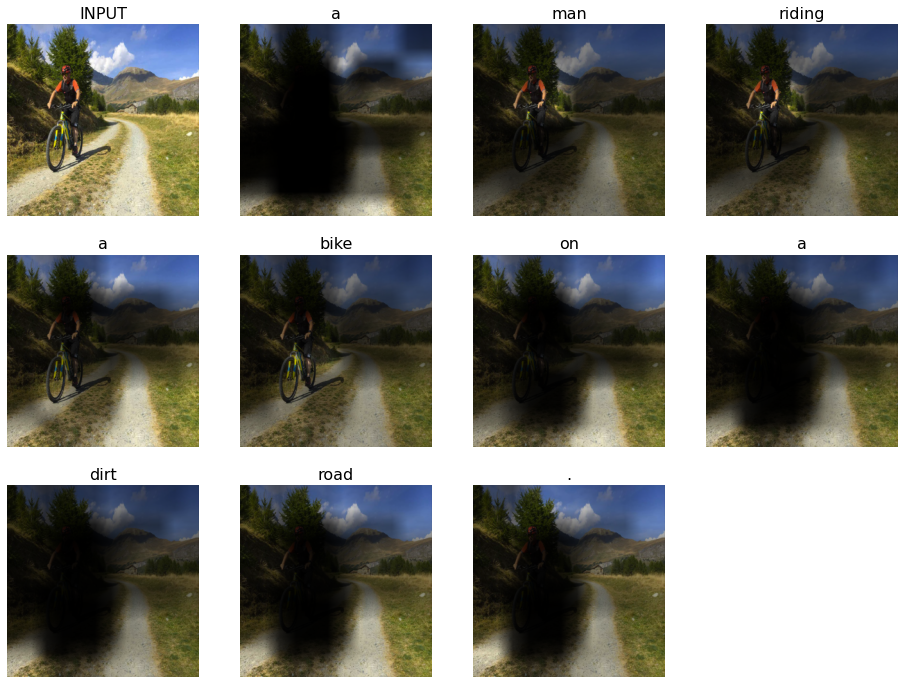

In [ ]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat sitting on a couch with a dog .
a cat sitting in a chair next to a black and white dog .
a cat sitting on a couch with a dog .
a cat sitting on top of a couch next to a cat .
a black and white cat sitting on a chair .
a cat sitting on a couch with a dog .
a cat sitting in a chair next to a black and white cat .
a cat sitting on a chair next to a black and white cat .
a cat sitting on a chair with a dog on its paws .
a cat sitting on a couch with a dog .


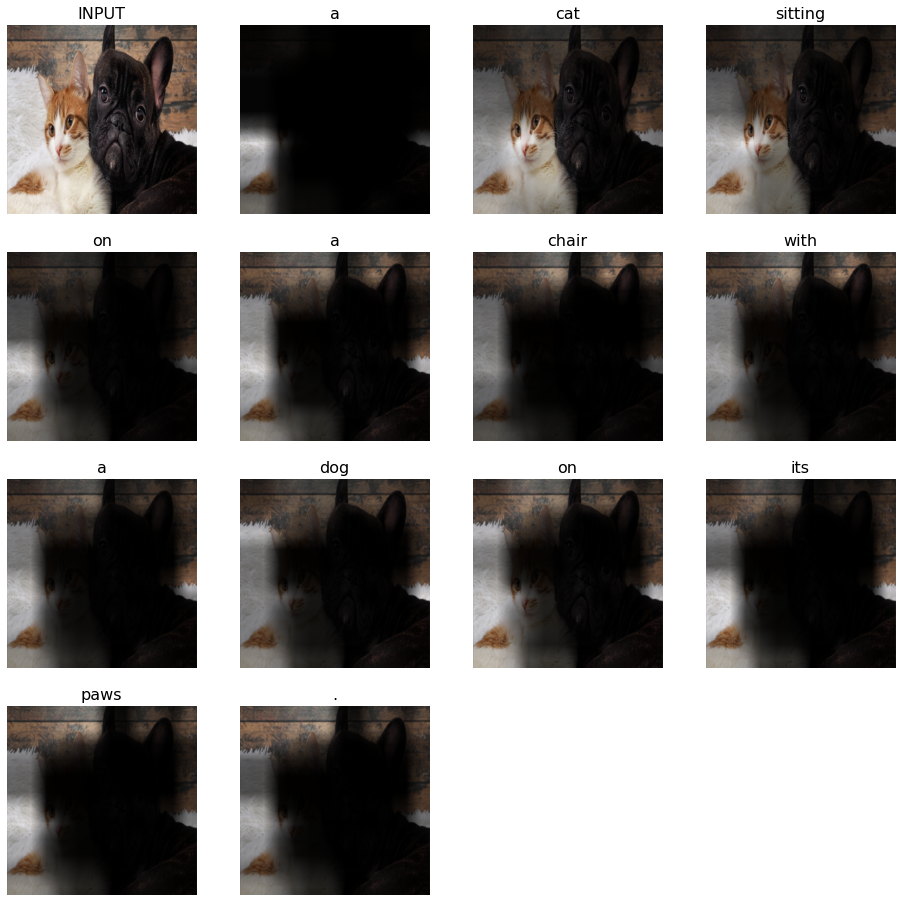

In [ ]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a baseball player is about to swing a bat .
a man riding a skateboard on top of a cement ramp .
a man riding a skateboard on top of a cement ramp .
a man riding a skateboard on top of a cement ramp .
a man riding a skateboard on top of a cement ramp .
a man riding a skateboard on a ramp .
a man riding a skateboard up the side of a ramp .
a man riding a skateboard on a ramp .
a man riding a skateboard on top of a cement ramp .
a man riding a skateboard on a ramp .


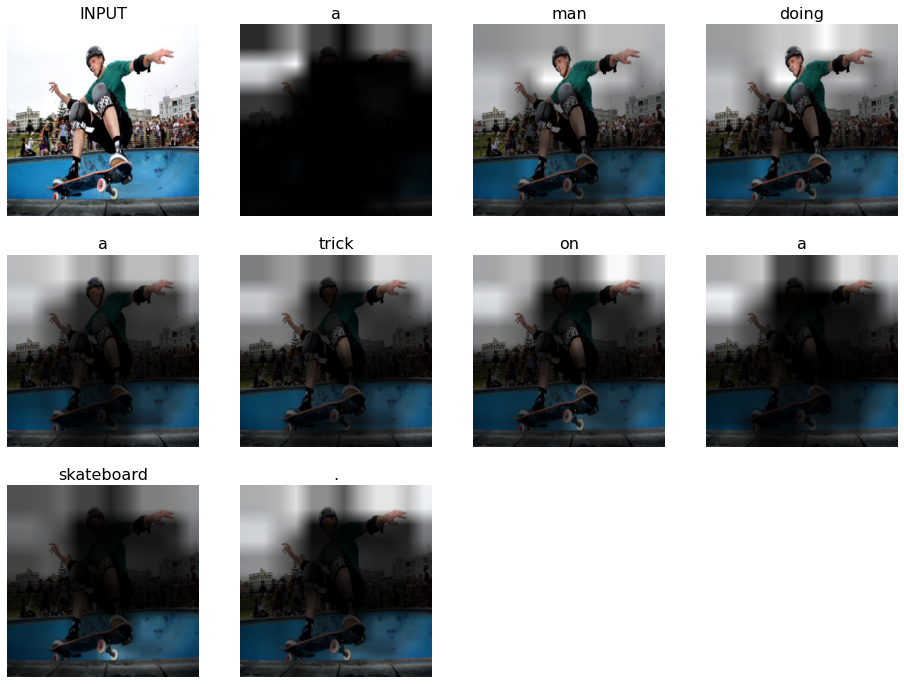

In [ ]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a woman in a dress holding a tennis racquet .
a woman holding a tennis racquet on a tennis court .
a woman is holding a tennis racket and looking at a camera .
a woman in a bikini holding a banana .
a woman holding a tennis racquet and a tennis racket .
a woman with a red shirt holding a banana .
a woman in a dress holding a frisbee in her hands .
a woman in a dress holding a banana .
a woman holding a tennis racquet on a tennis court .
a woman is holding a tennis racquet and looking at her head .


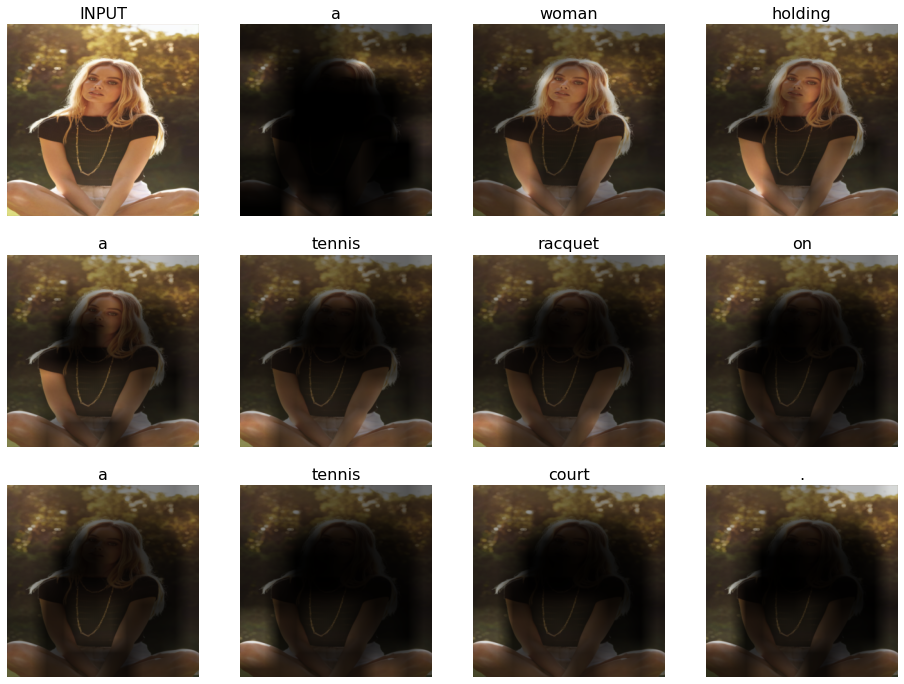

In [ ]:
link = "https://i.pinimg.com/originals/0a/72/a0/0a72a0c5b943c88192d300410bfa13ac.jpg"
process_image(obtain_image(url=link))

a group of people sitting at a table with a cake
a man is holding a large teddy bear .
a man and a woman sitting on a bench .
a man is holding a white frisbee in his hands .
a man and a woman in a #UNK# pose for a picture
a woman holding a large teddy bear in a park .
a group of people standing next to each other holding a frisbee .
a man and a woman are sitting on a bench .
a group of people standing next to each other .
a man and a woman in a #UNK# costume .


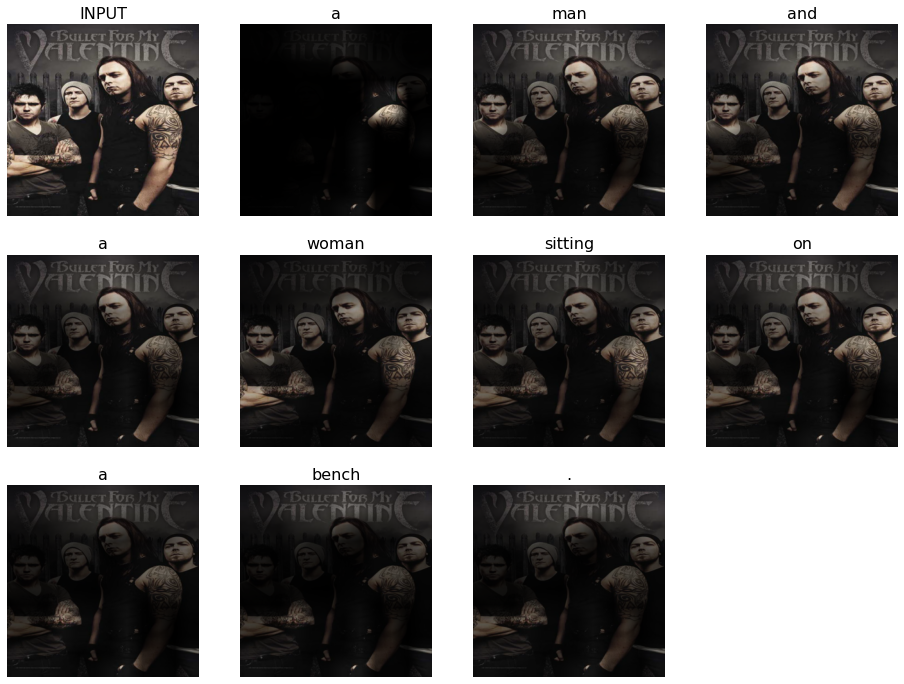

In [ ]:
link = "https://i.pinimg.com/originals/72/e3/9d/72e39d388799a2be042aaf571181b26b.jpg"
process_image(obtain_image(url=link))

a man is standing in the grass with a frisbee .
a man is standing in the grass with a frisbee .
a man is standing in the grass with a frisbee .
a man is riding a horse on a field .
a man is standing in the grass with a frisbee .
a man is holding a frisbee in his mouth .
a man is riding on the back of a horse .
a man is riding on the back of a horse .
a man is riding on the back of a horse .
a man riding a horse on a grassy field .


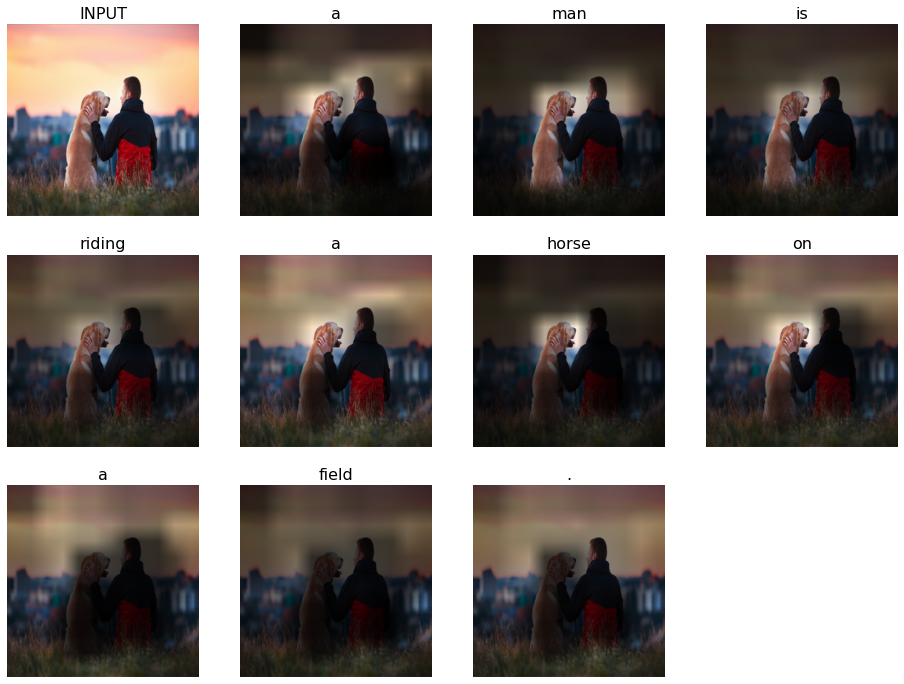

In [ ]:
link = "https://iso.500px.com/wp-content/uploads/2016/11/stock-photo-159533631-1500x1000.jpg"
process_image(obtain_image(url=link))

a woman with a #UNK# hair eating a banana .
a woman holding a white and white teddy bear .
a woman holding a banana and a banana .
a woman holding a banana and a banana .
a woman in a red dress holding a banana .
a woman in a dress holding a banana
a woman with a red hair and a girl holding a banana .
a woman holding a banana and a banana .
a woman holding a glass of flowers and a woman .
a woman with a red hair and a girl holding a teddy bear .


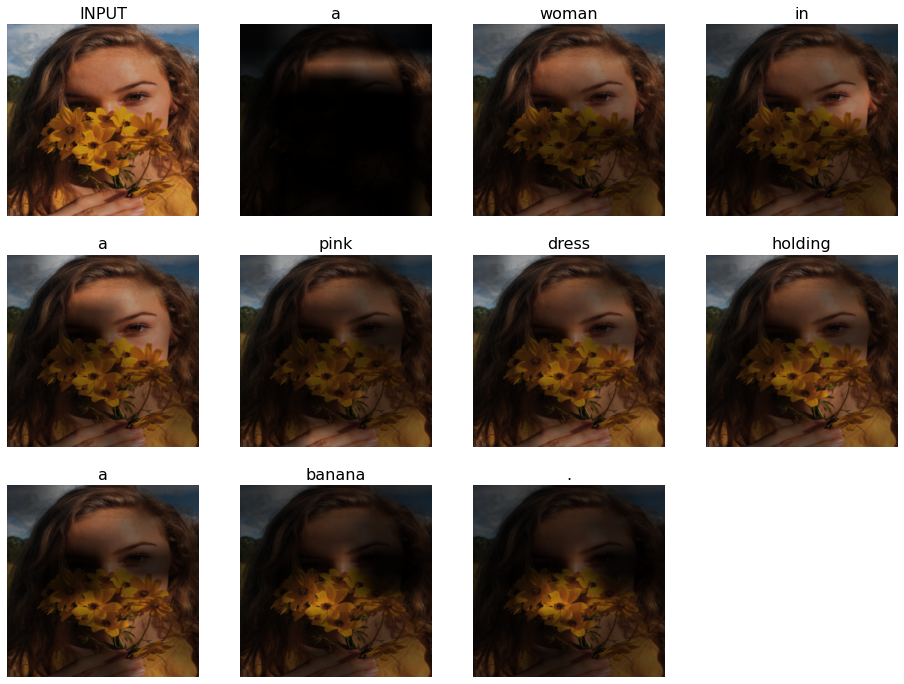

In [ ]:
link = "https://i.pinimg.com/originals/43/c4/22/43c4225c913a10cf6656a95641dc4de1.jpg"
process_image(obtain_image(url=link))

a person is riding a wave on a surfboard .
a person riding a wave on a surfboard .
a person riding a wave on a surfboard in the ocean .
a person on a surfboard riding a wave
a person on a surfboard riding a wave .
a person riding a wave on a surfboard .
a person is riding a wave on a surfboard .
a person is riding a wave on a surfboard .
a person on a surfboard riding a wave .
a person is riding a wave on a surfboard .


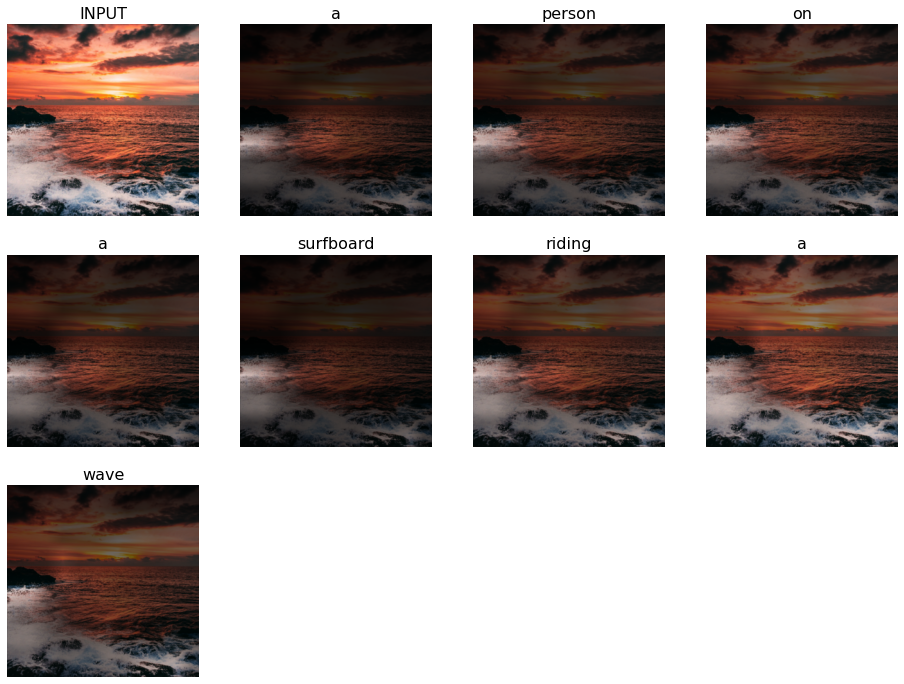

In [ ]:
link = "https://i.pinimg.com/originals/90/3c/b4/903cb4759245be7b63c29c447596e90f.jpg"
process_image(obtain_image(url=link))

a group of people flying kites in the air .
a group of people flying kites in the air .
a bunch of people flying kites in the air .
a group of people flying kites in the air .
a group of people flying kites in the air .
a group of people flying kites on a beach .
a group of people flying kites in the air .
a group of people flying kites in the air .
a group of people flying kites in the air .
a group of people flying kites in the air .


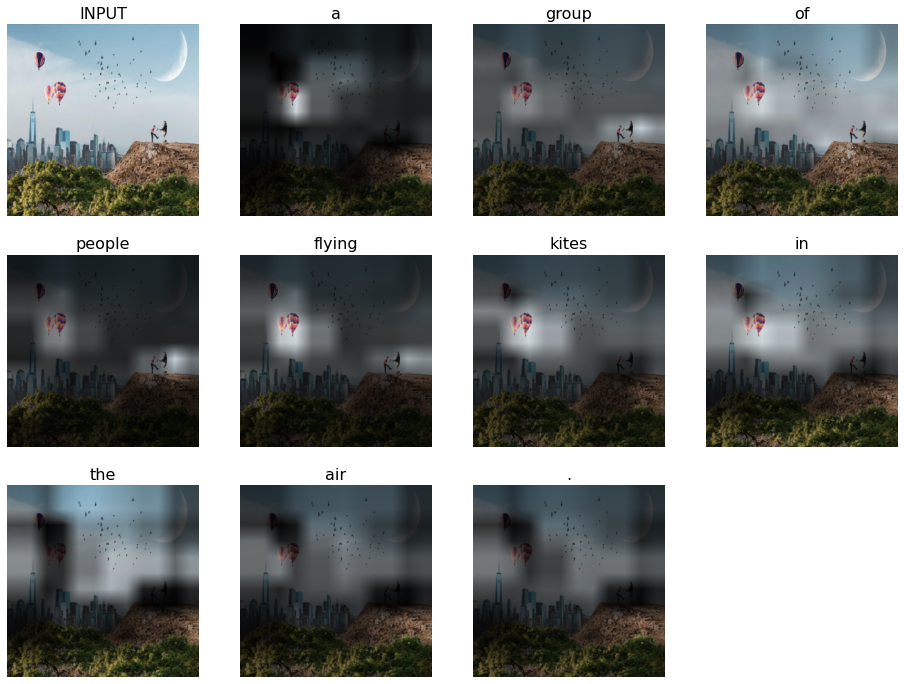

In [ ]:
link = "https://cnet3.cbsistatic.com/img/-qQkzFVyOPEoBRS7K5kKS0GFDvk=/940x0/2020/04/16/7d6d8ed2-e10c-4f91-b2dd-74fae951c6d8/bazaart-edit-app.jpg"
process_image(obtain_image(url=link))

a woman is riding a horse on a sunny day .
a woman standing in a field with a frisbee in the background .
a woman in a hat is sitting on a bench .
a woman is standing in the grass with a frisbee .
a woman is holding a cell phone in the air .
a woman is standing in the middle of a road .
a woman holding a cell phone in a park .
a woman is standing in the middle of a park .
a woman in a red shirt and a hat is standing in a park .
a woman is sitting on a bench with a dog .


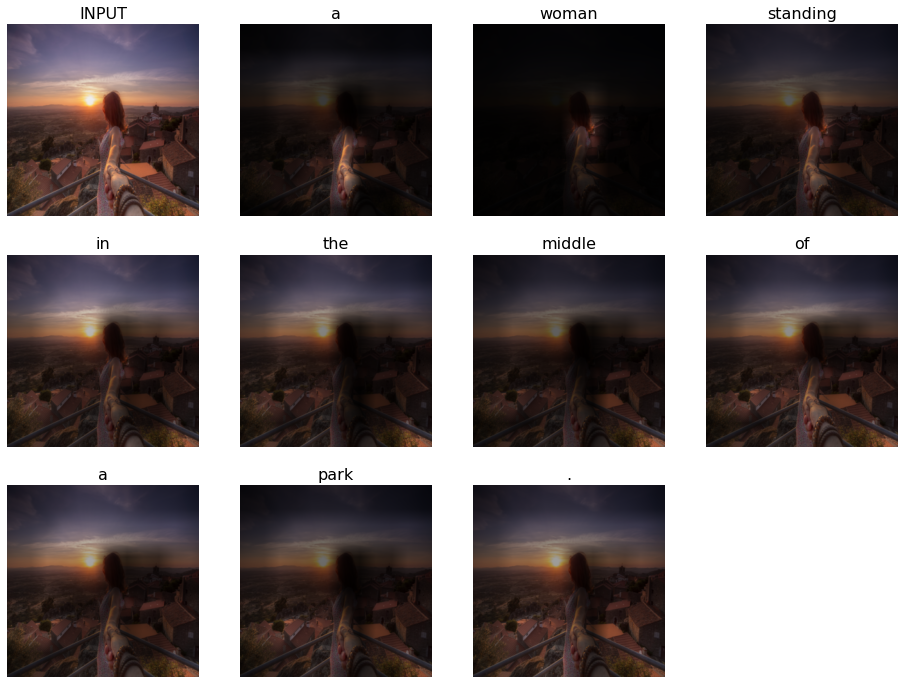

In [ ]:
link = "https://iso.500px.com/wp-content/uploads/2016/02/stock-photo-114337435.jpg"
process_image(obtain_image(url=link))

a brown cow standing next to a wire fence .
a giraffe standing next to a wire fence .
a giraffe standing next to a wire fence .
a giraffe standing next to a wire fence .
a couple of giraffes looking at each other
a brown horse standing next to a wire fence .
a giraffe standing next to a wire fence .
a brown and white horse standing next to a wire fence .
a giraffe standing next to a wire fence .
a couple of giraffes standing next to each other .


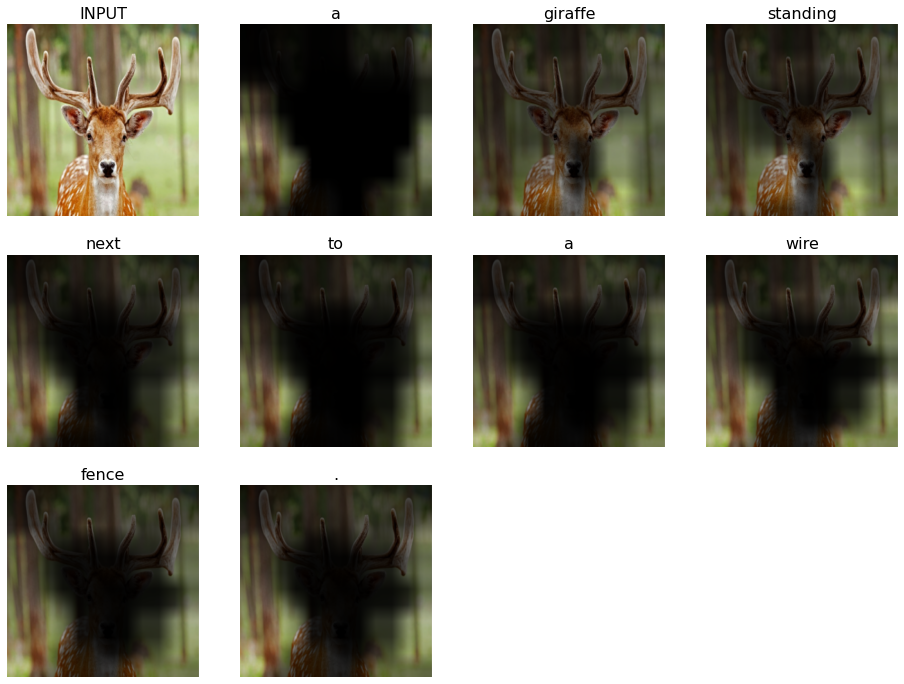

In [ ]:
link = "https://radiokp.ru/sites/default/files/styles/kp_fullnode_730_486/public/2020-06/1_28.jpg?itok=z435492u"
process_image(obtain_image(url=link))


a man wearing a suit and tie on a cell phone .
a man in a suit and tie standing next to a white wall .
a man wearing a tie and a tie
a man in a suit with a tie and a tie
a man wearing a suit and tie and tie
a man wearing a suit and tie standing next to a woman .
a man in a suit with a tie on his face .
a man in a suit with a tie and a tie
a man wearing a suit and tie and tie
a man in a suit with a tie and a tie


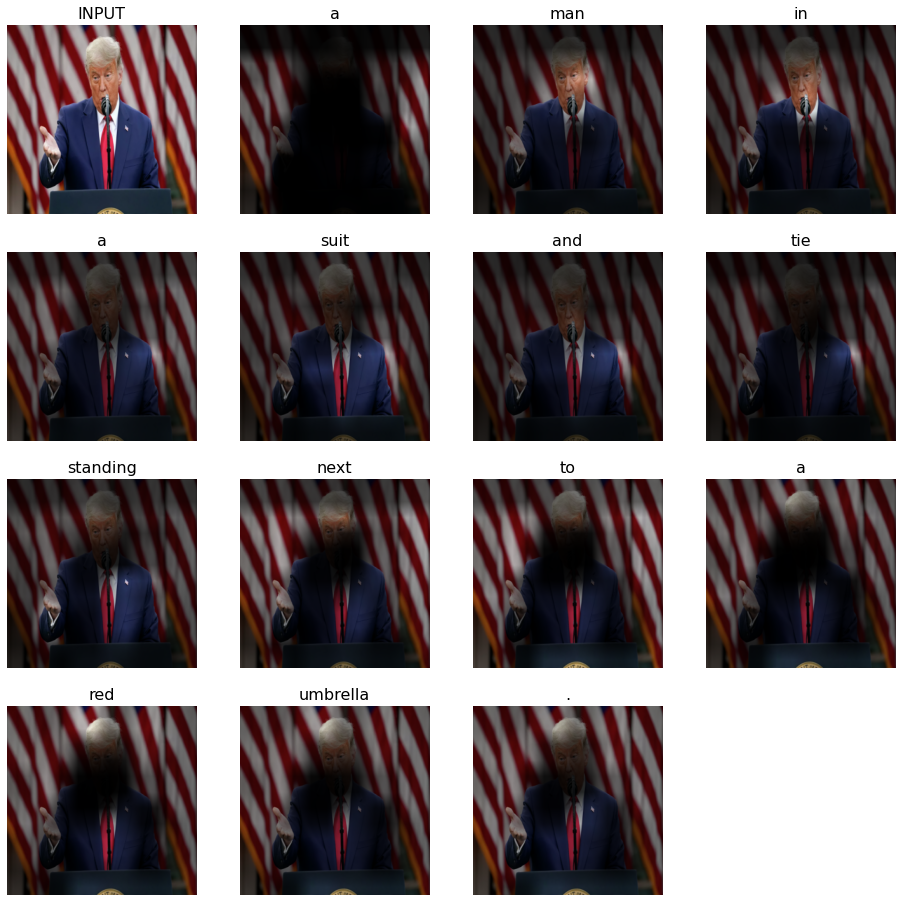

In [ ]:
link = "https://cdn25.img.ria.ru/images/07e4/0b/10/1584775132_0:0:3072:2048_1440x900_80_0_1_5591331aba6caf049de30a69abe78787.jpg.webp?source-sid=ap_photo"
process_image(obtain_image(url=link))

a man with a tie and a tie and a tie
a man wearing a suit and tie and a tie
a man wearing a suit and tie and a tie .
a man wearing a suit and tie and a tie
a man in a suit with a tie and a tie
a man wearing a suit and tie and a tie
a man wearing a suit and tie and a tie .
a man with a tie and a tie and a tie
a man wearing a suit and tie and a tie
a man wearing a suit and tie and a tie .


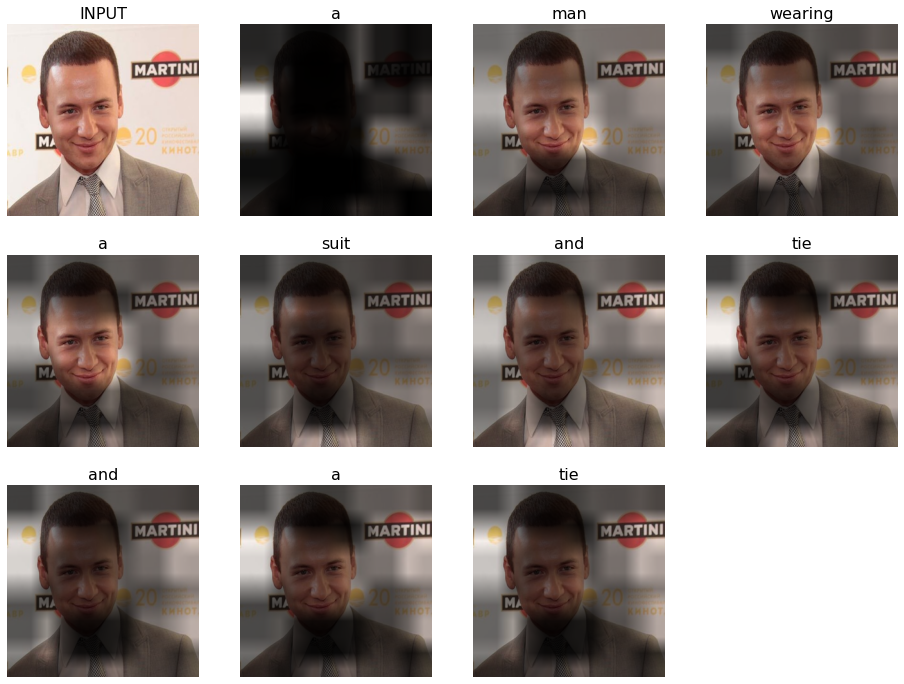

In [ ]:
link = "https://img-fotki.yandex.ru/get/5901/changmai.1a/0_4d467_fe13a682_-1-XL.jpg"
process_image(obtain_image(url=link))

a man wearing a suit and tie and a tie
a man in a suit is wearing a hat and tie
a man in a suit with a tie and a tie .
a man in a suit and tie standing next to a man wearing a suit .
a man wearing a suit and tie and tie
a man wearing a suit and tie and a tie .
a man wearing a suit and tie and a tie
a man wearing a tie and a tie
a man in a suit and tie with a tie and a tie .
a man wearing a suit and tie and a tie


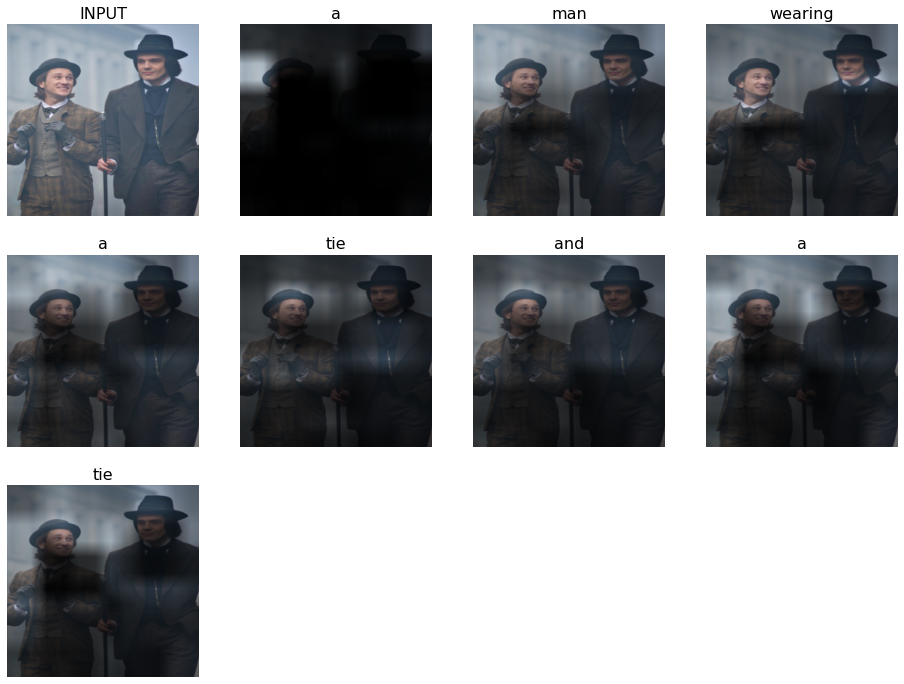

In [ ]:
link = "https://www.culture.ru/storage/images/61489c338c09d349f851da4c559477bc/ffe8f312dde57628d27adb87f08ba0bd.jpg"
process_image(obtain_image(url=link))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

It seems that NN is trained quiet well, because it generates some meaningfull captions. But I am not sure how to evaluate its extent of overfitting by visual assesment of attention masks and by analizing captions.  

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563